In [1]:
#!/usr/bin/env python
# coding: utf-8

import os
import time
import fnmatch
import cv2
from osgeo import gdal
import numpy as np
from matplotlib import pyplot as plt
from phasepack import phasecong
from einops import repeat
from skimage import measure
from skimage import transform
import math
import plotmatch
import plotmatch1
import random
%matplotlib inline
# %matplotlib notebook

# 提取keypiont对象的坐标值
def kp2point(kp):
    m_points = np.zeros([len(kp), 2], int)
    for i in range(len(kp)):
        m_points[i][0] = int(kp[i].pt[0])
        m_points[i][1] = int(kp[i].pt[1])
    return m_points

# 提取keypiont对象的方向
def kp2angle(kp):
    m_angle = np.zeros([len(kp),1], float)
    for i in range(len(kp)):
        m_angle[i][0] = kp[i].angle
    return m_angle

def compute_orientation(img, keypoints):
    # 计算图像的x和y方向的Sobel梯度
    grad_x = cv2.Sobel(img, cv2.CV_32F, 1, 0, ksize=3)
    grad_y = cv2.Sobel(img, cv2.CV_32F, 0, 1, ksize=3)
    
    # 为每个特征点计算方向
    angles = np.arctan2(grad_y, grad_x)
    for kp in keypoints:
        x, y = int(kp.pt[0]), int(kp.pt[1])
        kp.angle = np.degrees(angles[y, x])
        # print(kp.angle)

def rotate_image(img, x, y, angle):
    # 获取图像尺寸
    (h, w) = img.shape[:2]

    # 确保旋转中心在图像内部
    if x >= w or y >= h:
        return None  # 旋转中心超出图像范围，返回None或其它错误处理

    # 计算旋转矩阵
    M = cv2.getRotationMatrix2D((x, y), angle, 1.0)

    # 进行仿射变换
    rotated = cv2.warpAffine(img, M, (w, h))

    return rotated

def transform_image_with_start(image, start):
    # 对所有像素值增加start，然后对超过8的结果减去9
    transformed_image = (image + start) % 6
    return transformed_image

def RIFT_descriptor_rotation_invariance(img, kps, angles,start, eo, patch_size, s, o):
    KPS = kps.T
    (yim, xim, _) = np.shape(img)
    CS = np.zeros([yim, xim, o], np.float32)
    for j in range(o):
        for i in range(s):
            # 将各个scale的变换结果的幅度相加
            CS[..., j] = CS[..., j] + np.abs(np.array(eo[j][i]))

    MIM = np.argmax(CS, axis=2)

    des = np.zeros([36 * o, np.size(KPS, 1)])
    kps_to_ignore = np.ones([1, np.size(KPS, 1)], bool)
    
    for k in range(np.size(KPS, 1)):
        x = round(KPS[0][k])
        y = round(KPS[1][k])
        # 调用函数，实现旋转
        MIM = MIM.astype('uint8')
        rotated_MIM = rotate_image(MIM,x ,y, angles[k][0])
        
        x1 = max(0, x - math.floor(patch_size / 2))
        y1 = max(0, y - math.floor(patch_size / 2))
        x2 = min(x + math.floor(patch_size / 2), np.size(img, 1))
        y2 = min(y + math.floor(patch_size / 2), np.size(img, 0))

        if y2 - y1 != patch_size or x2 - x1 != patch_size:
            kps_to_ignore[0][k] = 0
            continue

        patch = rotated_MIM[y1-1:y2, x1-1:x2]
        ys, xs = np.size(patch, 0), np.size(patch, 1)
        ns = 6
        RIFT_des = np.zeros([ns, ns, o])

        for j in range(ns):
            for i in range(ns):

                a1 = np.round((j) * ys / ns)
                a2 = np.round((j + 1) * ys / ns)
                b1 = np.round((i) * xs / ns)
                b2 = np.round((i + 1) * xs / ns)

                clip = patch[int(a1):int(a2), int(b1):int(b2)]

                fea, __ = np.histogram(clip.T.flatten(), bins=6, range=(0, o), density=False)

                RIFT_des[j][i] = fea.reshape(1, 1, len(fea))

        RIFT_des = RIFT_des.T.flatten()

        # 求范数（即归一化）
        df = np.linalg.norm(RIFT_des)
        if df != 0:
            RIFT_des = RIFT_des / df
    
    # 沿着纵轴方向重复，增加列数,
    m = repeat(kps_to_ignore, '1 n -> c n', c=2)
    v = KPS[m]
    KPS_out = v.reshape(2, int(len(v) / 2)).T
    w = repeat(kps_to_ignore, '1 n -> c n', c=len(des))
    z = des[w]
    des_out = z.reshape(len(des), int(len(z) / len(des))).T
    des_out = np.float32(des_out)

    return KPS_out, des_out


def rotate_points(image, points, angle):
    # 图像尺寸
    h, w = image.shape[:2]
    # 计算图像的中心点
    center = (w / 2, h / 2)
    # 构建旋转矩阵，第一个参数是旋转中心，第二个参数是旋转角度，第三个是缩放因子
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    # 旋转特征点
    ones = np.ones(shape=(len(points), 1))
    points_ones = np.hstack([points, ones])
    # 应用旋转矩阵
    transformed_points = M.dot(points_ones.T).T

    return transformed_points



-----------------------------------------------------------------------------
D:\P2_4\JJ\Pair_0p\00000\GT_M.txt
D:\P2_4\JJ\Pair_0p\00000\1013.png
start_no: 0
start_no: 1
start_no: 2
start_no: 3
start_no: 4
start_no: 5
计算耗时 45.615
D:\P2_4\JJ\Pair_0p\00000\1047.png
start_no: 0
start_no: 1
start_no: 2
start_no: 3
start_no: 4
start_no: 5
计算耗时 41.606
D:\P2_4\JJ\Pair_0p\00000\1078.png
start_no: 0
start_no: 1
start_no: 2
start_no: 3
start_no: 4
start_no: 5
计算耗时 43.994
D:\P2_4\JJ\Pair_0p\00000\1111.png
start_no: 0
start_no: 1
start_no: 2
start_no: 3
start_no: 4
start_no: 5
计算耗时 42.206
D:\P2_4\JJ\Pair_0p\00000\1144.png
start_no: 0
start_no: 1
start_no: 2
start_no: 3
start_no: 4
start_no: 5
计算耗时 44.351
D:\P2_4\JJ\Pair_0p\00000\1173.png
start_no: 0
start_no: 1
start_no: 2
start_no: 3
start_no: 4
start_no: 5
计算耗时 45.254
-----------------------------------------------------------------------------
D:\P2_4\JJ\Pair_0p\00001\GT_M.txt
D:\P2_4\JJ\Pair_0p\00001\1013.png
start_no: 0
start_no: 1
start_no: 

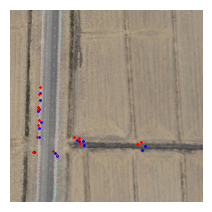

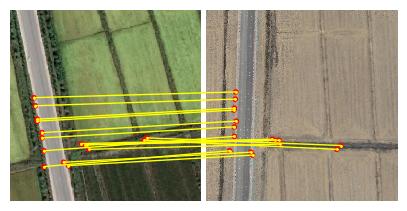

计算耗时 14.383
D:\P2_4\JJ\Pair_0p\00002\1047.png
start_no: 0
start_no: 1
成功
RMSE: 28.321872186941476
精匹配点: 13


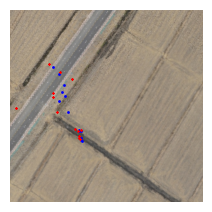

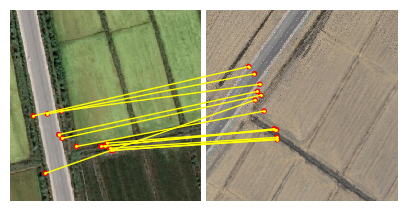

计算耗时 21.295
D:\P2_4\JJ\Pair_0p\00002\1078.png
start_no: 0
start_no: 1
start_no: 2
成功
RMSE: 7.093002407642786
精匹配点: 15


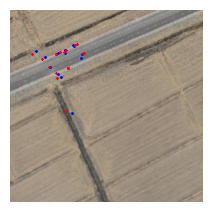

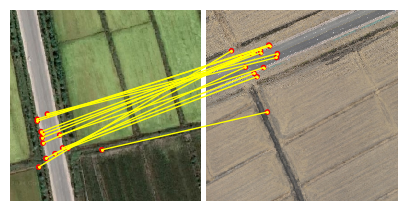

计算耗时 29.180
D:\P2_4\JJ\Pair_0p\00002\1111.png
start_no: 0
start_no: 1
start_no: 2
start_no: 3
成功
RMSE: 18.395892399144135
精匹配点: 10


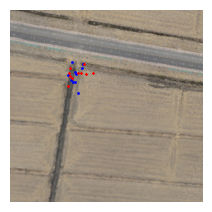

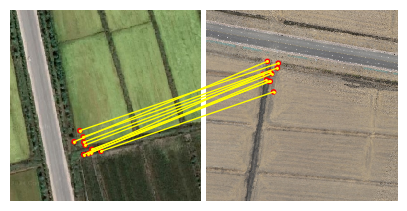

计算耗时 32.184
D:\P2_4\JJ\Pair_0p\00002\1144.png
start_no: 0
start_no: 1
start_no: 2
start_no: 3
start_no: 4
成功
RMSE: 6.725142231128077
精匹配点: 15


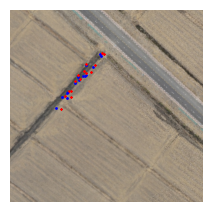

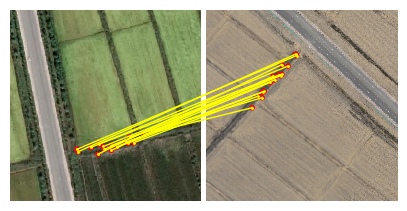

计算耗时 40.196
D:\P2_4\JJ\Pair_0p\00002\1173.png
start_no: 0
成功
RMSE: 18.45694579887407
精匹配点: 9


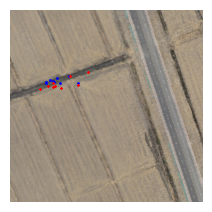

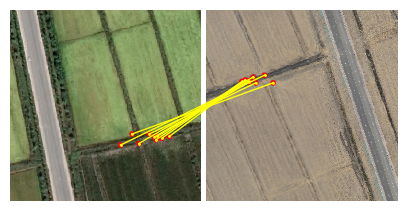

计算耗时 15.516
-----------------------------------------------------------------------------
D:\P2_4\JJ\Pair_0p\00003\GT_M.txt
D:\P2_4\JJ\Pair_0p\00003\1013.png
start_no: 0
成功
RMSE: 12.792251520393096
精匹配点: 19


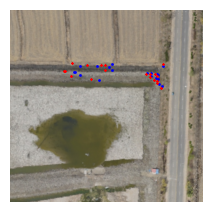

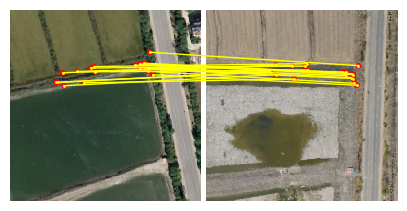

计算耗时 15.111
D:\P2_4\JJ\Pair_0p\00003\1047.png
start_no: 0
start_no: 1
start_no: 2
start_no: 3
start_no: 4
start_no: 5
计算耗时 53.562
D:\P2_4\JJ\Pair_0p\00003\1078.png
start_no: 0
start_no: 1
start_no: 2
成功
RMSE: 8.640986737903951
精匹配点: 19


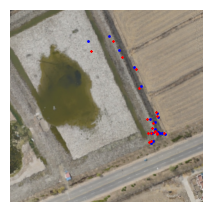

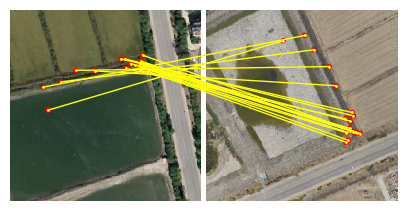

计算耗时 30.284
D:\P2_4\JJ\Pair_0p\00003\1111.png
start_no: 0
start_no: 1
start_no: 2
start_no: 3
成功
RMSE: 17.544225925724813
精匹配点: 16


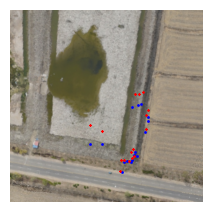

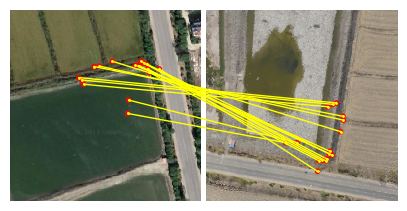

计算耗时 36.440
D:\P2_4\JJ\Pair_0p\00003\1144.png
start_no: 0
start_no: 1
start_no: 2
start_no: 3
start_no: 4
成功
RMSE: 28.123970074056437
精匹配点: 9


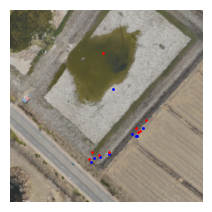

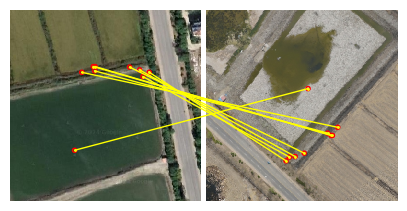

计算耗时 43.325
D:\P2_4\JJ\Pair_0p\00003\1173.png
start_no: 0
start_no: 1
start_no: 2
start_no: 3
start_no: 4
start_no: 5
计算耗时 51.599
-----------------------------------------------------------------------------
D:\P2_4\JJ\Pair_0p\00004\GT_M.txt
D:\P2_4\JJ\Pair_0p\00004\1013.png
start_no: 0
成功
RMSE: 8.782672169119685
精匹配点: 37


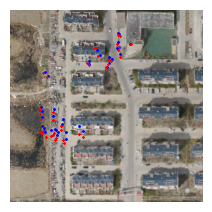

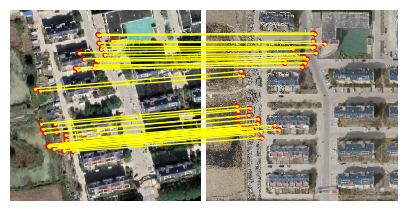

计算耗时 18.875
D:\P2_4\JJ\Pair_0p\00004\1047.png
start_no: 0
start_no: 1
成功
RMSE: 9.280224017338098
精匹配点: 26


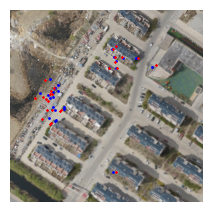

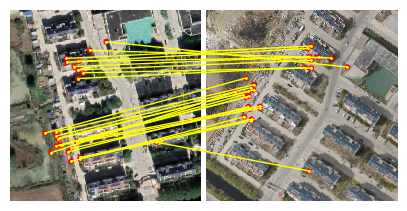

计算耗时 30.794
D:\P2_4\JJ\Pair_0p\00004\1078.png
start_no: 0
start_no: 1
start_no: 2
成功
RMSE: 7.250089783000906
精匹配点: 29


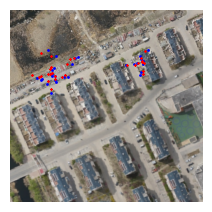

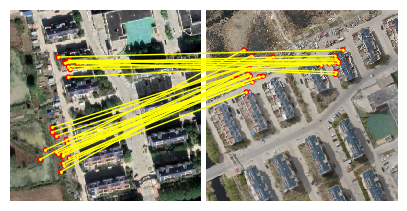

计算耗时 41.329
D:\P2_4\JJ\Pair_0p\00004\1111.png
start_no: 0
start_no: 1
start_no: 2
start_no: 3
成功
RMSE: 13.742425183958588
精匹配点: 33


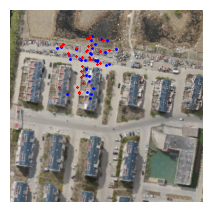

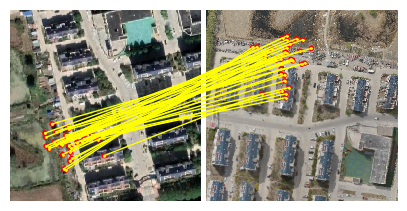

计算耗时 47.472
D:\P2_4\JJ\Pair_0p\00004\1144.png
start_no: 0
start_no: 1
start_no: 2
start_no: 3
start_no: 4
成功
RMSE: 9.522752883230908
精匹配点: 15


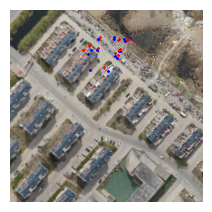

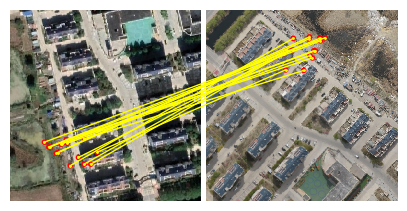

计算耗时 57.881
D:\P2_4\JJ\Pair_0p\00004\1173.png
start_no: 0
成功
RMSE: 5.1235602921582295
精匹配点: 21


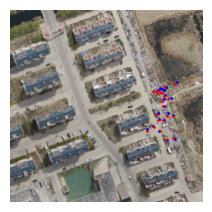

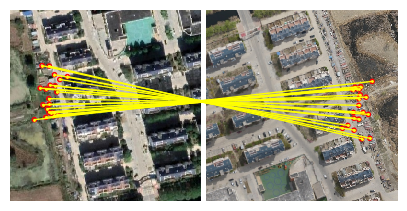

计算耗时 19.108
-----------------------------------------------------------------------------
D:\P2_4\JJ\Pair_0p\00005\GT_M.txt
D:\P2_4\JJ\Pair_0p\00005\1013.png
start_no: 0
成功
RMSE: 18.283660327358845
精匹配点: 22


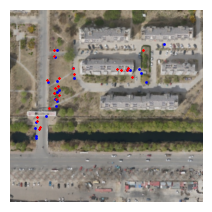

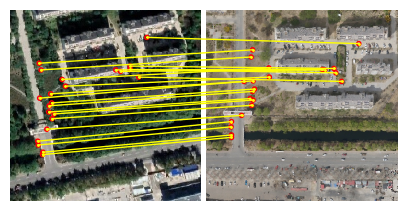

计算耗时 17.752
D:\P2_4\JJ\Pair_0p\00005\1047.png
start_no: 0
start_no: 1
成功
RMSE: 18.312720074377754
精匹配点: 20


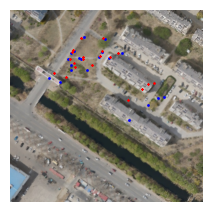

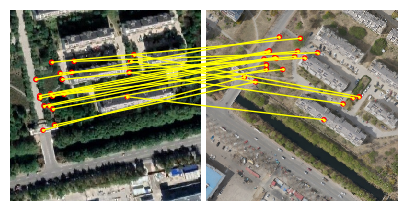

计算耗时 26.021
D:\P2_4\JJ\Pair_0p\00005\1078.png
start_no: 0
start_no: 1
start_no: 2
成功
RMSE: 22.97997376293452
精匹配点: 18


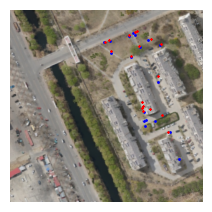

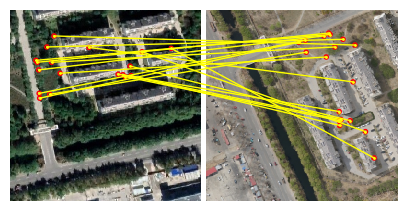

计算耗时 36.179
D:\P2_4\JJ\Pair_0p\00005\1111.png
start_no: 0
start_no: 1
start_no: 2
start_no: 3
成功
RMSE: 26.41528512822271
精匹配点: 13


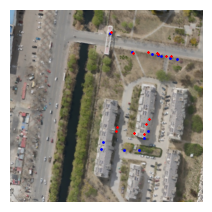

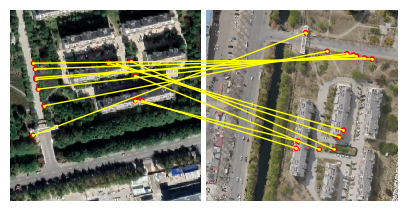

计算耗时 44.366
D:\P2_4\JJ\Pair_0p\00005\1144.png
start_no: 0
start_no: 1
start_no: 2
start_no: 3
start_no: 4
成功
RMSE: 16.353109354490076
精匹配点: 8


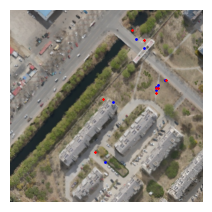

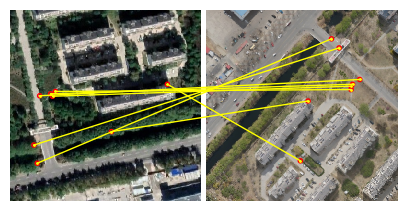

计算耗时 53.426
D:\P2_4\JJ\Pair_0p\00005\1173.png
start_no: 0
成功
RMSE: 21.186284240885147
精匹配点: 12


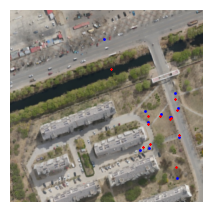

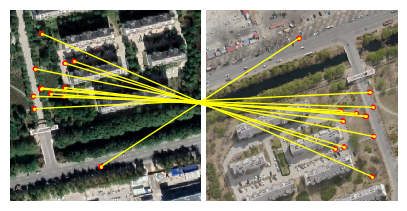

计算耗时 17.863
-----------------------------------------------------------------------------
D:\P2_4\JJ\Pair_0p\00006\GT_M.txt
D:\P2_4\JJ\Pair_0p\00006\1013.png
start_no: 0
成功
RMSE: 3.5817802772824345
精匹配点: 100


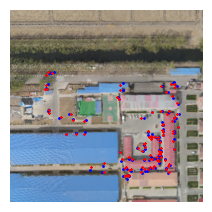

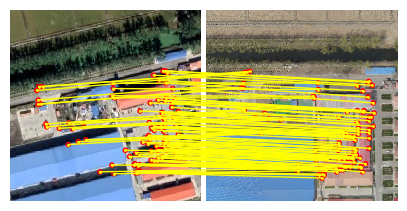

计算耗时 17.537
D:\P2_4\JJ\Pair_0p\00006\1047.png
start_no: 0
start_no: 1
成功
RMSE: 4.5300614816047275
精匹配点: 80


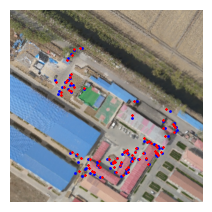

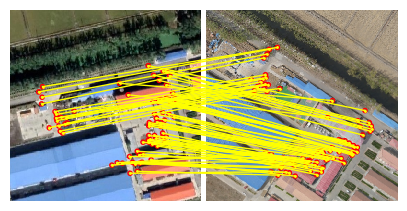

计算耗时 25.320
D:\P2_4\JJ\Pair_0p\00006\1078.png
start_no: 0
start_no: 1
start_no: 2
成功
RMSE: 3.9746193206779155
精匹配点: 94


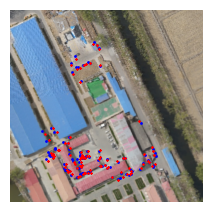

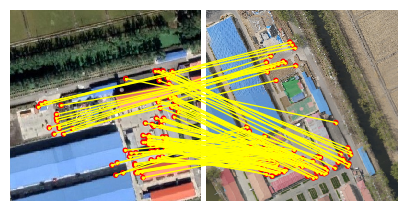

计算耗时 33.312
D:\P2_4\JJ\Pair_0p\00006\1111.png
start_no: 0
start_no: 1
start_no: 2
start_no: 3
成功
RMSE: 4.4449760318165525
精匹配点: 84


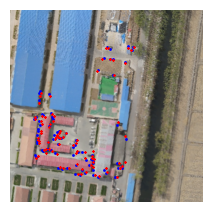

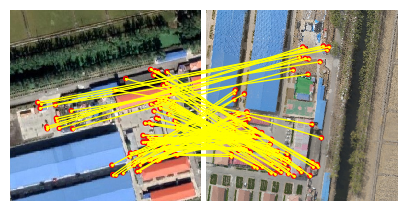

计算耗时 40.899
D:\P2_4\JJ\Pair_0p\00006\1144.png
start_no: 0
start_no: 1
start_no: 2
start_no: 3
start_no: 4
成功
RMSE: 3.868937138786112
精匹配点: 78


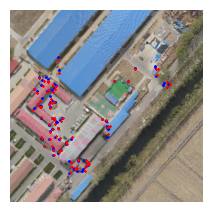

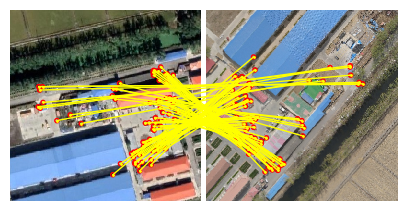

计算耗时 47.407
D:\P2_4\JJ\Pair_0p\00006\1173.png
start_no: 0
start_no: 1
start_no: 2
start_no: 3
start_no: 4
start_no: 5
成功
RMSE: 4.178735244793495
精匹配点: 89


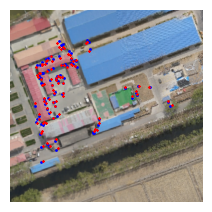

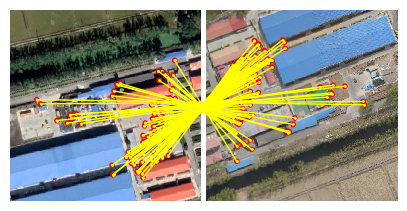

计算耗时 59.807
-----------------------------------------------------------------------------
D:\P2_4\JJ\Pair_0p\00007\GT_M.txt
D:\P2_4\JJ\Pair_0p\00007\1013.png
start_no: 0
成功
RMSE: 4.000936016947975
精匹配点: 118


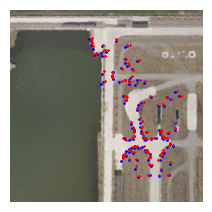

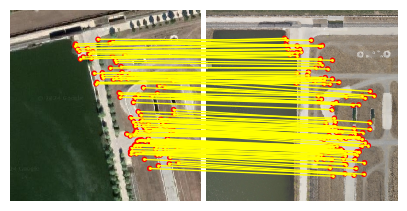

计算耗时 14.562
D:\P2_4\JJ\Pair_0p\00007\1047.png
start_no: 0
start_no: 1
成功
RMSE: 5.491172929884914
精匹配点: 63


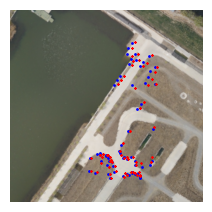

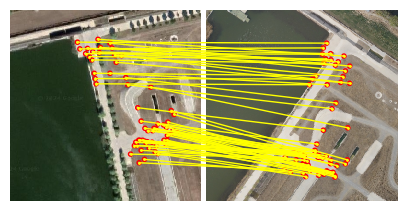

计算耗时 21.514
D:\P2_4\JJ\Pair_0p\00007\1078.png
start_no: 0
start_no: 1
start_no: 2
成功
RMSE: 6.817145303774563
精匹配点: 65


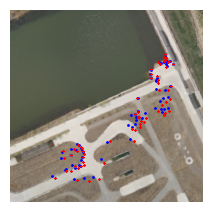

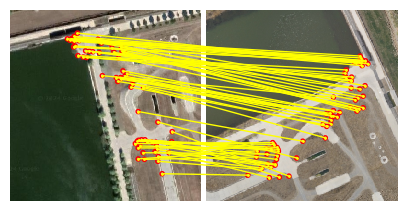

计算耗时 27.668
D:\P2_4\JJ\Pair_0p\00007\1111.png
start_no: 0
start_no: 1
start_no: 2
start_no: 3
成功
RMSE: 10.329553268138978
精匹配点: 44


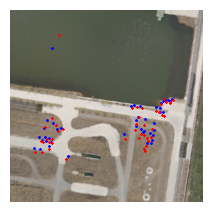

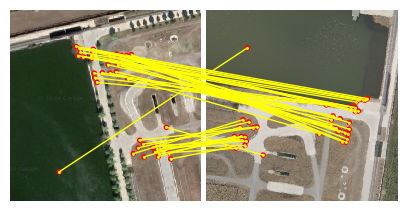

计算耗时 34.015
D:\P2_4\JJ\Pair_0p\00007\1144.png
start_no: 0
start_no: 1
start_no: 2
start_no: 3
start_no: 4
成功
RMSE: 9.769902723514694
精匹配点: 29


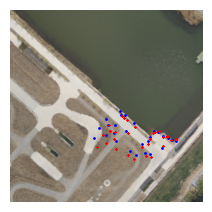

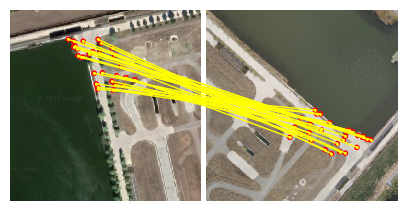

计算耗时 42.191
D:\P2_4\JJ\Pair_0p\00007\1173.png
start_no: 0
成功
RMSE: 5.508220963720889
精匹配点: 115


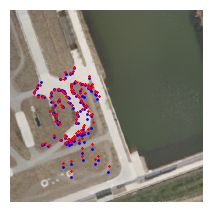

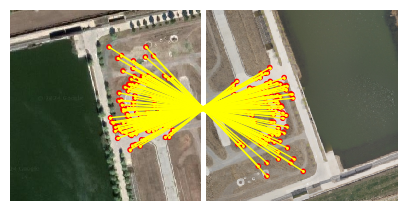

计算耗时 14.216
-----------------------------------------------------------------------------
D:\P2_4\JJ\Pair_0p\00008\GT_M.txt
D:\P2_4\JJ\Pair_0p\00008\1013.png
start_no: 0
成功
RMSE: 13.761711270282143
精匹配点: 17


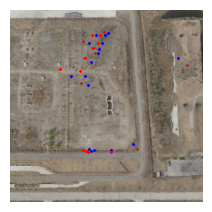

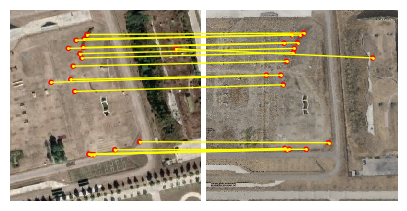

计算耗时 14.147
D:\P2_4\JJ\Pair_0p\00008\1047.png
start_no: 0
start_no: 1
成功
RMSE: 11.89317585341068
精匹配点: 16


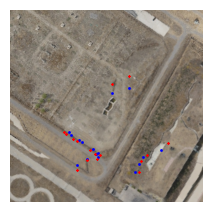

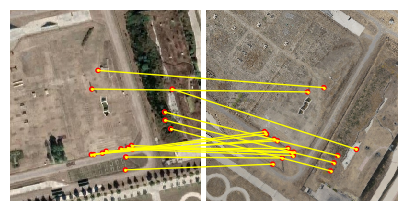

计算耗时 20.168
D:\P2_4\JJ\Pair_0p\00008\1078.png
start_no: 0
start_no: 1
start_no: 2
成功
RMSE: 8.612227526035722
精匹配点: 14


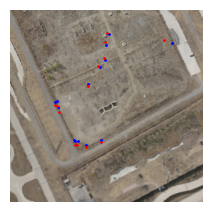

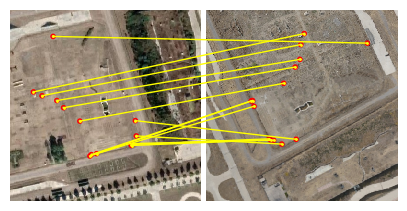

计算耗时 30.268
D:\P2_4\JJ\Pair_0p\00008\1111.png
start_no: 0
start_no: 1
start_no: 2
start_no: 3
成功
RMSE: 24.512723894985996
精匹配点: 10


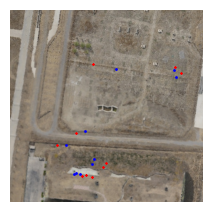

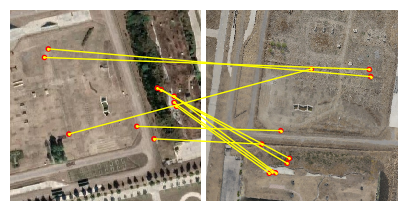

计算耗时 36.403
D:\P2_4\JJ\Pair_0p\00008\1144.png
start_no: 0
start_no: 1
start_no: 2
start_no: 3
start_no: 4
成功
RMSE: 21.060932603471173
精匹配点: 15


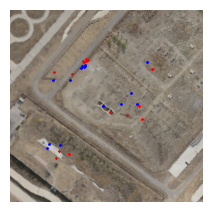

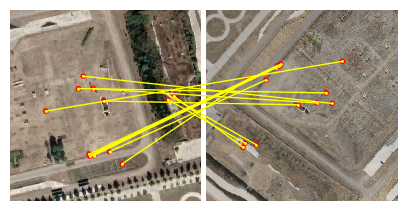

计算耗时 41.663
D:\P2_4\JJ\Pair_0p\00008\1173.png
start_no: 0
成功
RMSE: 9.915681418053595
精匹配点: 22


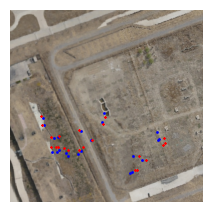

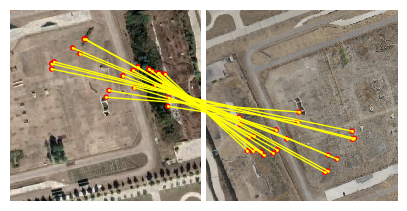

计算耗时 15.069
-----------------------------------------------------------------------------
D:\P2_4\JJ\Pair_0p\00009\GT_M.txt
D:\P2_4\JJ\Pair_0p\00009\1013.png
start_no: 0
start_no: 1
start_no: 2
start_no: 3
start_no: 4
start_no: 5
计算耗时 50.292
D:\P2_4\JJ\Pair_0p\00009\1047.png
start_no: 0
start_no: 1
start_no: 2
start_no: 3
start_no: 4
start_no: 5
计算耗时 53.620
D:\P2_4\JJ\Pair_0p\00009\1078.png
start_no: 0
start_no: 1
start_no: 2
start_no: 3
start_no: 4
start_no: 5
计算耗时 54.632
D:\P2_4\JJ\Pair_0p\00009\1111.png
start_no: 0
start_no: 1
start_no: 2
start_no: 3
start_no: 4
start_no: 5
计算耗时 50.278
D:\P2_4\JJ\Pair_0p\00009\1144.png
start_no: 0
start_no: 1
start_no: 2
start_no: 3
start_no: 4
start_no: 5
计算耗时 56.637
D:\P2_4\JJ\Pair_0p\00009\1173.png
start_no: 0
start_no: 1
start_no: 2
start_no: 3
start_no: 4
start_no: 5
计算耗时 55.148
-----------------------------------------------------------------------------
D:\P2_4\JJ\Pair_0p\00010\GT_M.txt
D:\P2_4\JJ\Pair_0p\00010\1013.png
start_no: 0
start_no: 

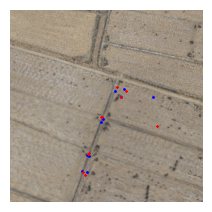

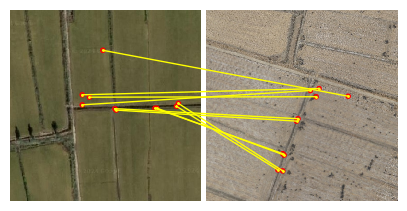

计算耗时 40.393
D:\P2_4\JJ\Pair_0p\00010\1144.png
start_no: 0
start_no: 1
start_no: 2
start_no: 3
start_no: 4
start_no: 5
成功
RMSE: 7.564661382842774
精匹配点: 27


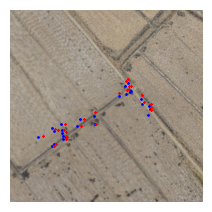

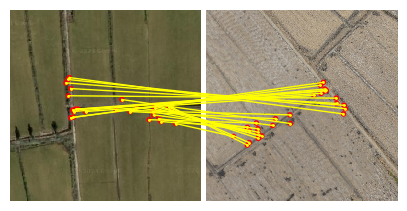

计算耗时 48.311
D:\P2_4\JJ\Pair_0p\00010\1173.png
start_no: 0
成功
RMSE: 9.803006021276358
精匹配点: 24


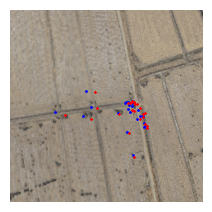

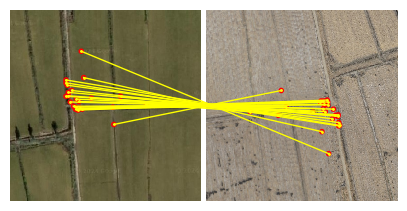

计算耗时 14.478
-----------------------------------------------------------------------------
D:\P2_4\JJ\Pair_0p\00011\GT_M.txt
D:\P2_4\JJ\Pair_0p\00011\1013.png
start_no: 0
start_no: 1
start_no: 2
start_no: 3
start_no: 4
start_no: 5
计算耗时 50.926
D:\P2_4\JJ\Pair_0p\00011\1047.png
start_no: 0
start_no: 1
start_no: 2


KeyboardInterrupt: 

In [2]:
# 设置根目录路径
root_dir = r'D:\P2_4\JJ\Pair_0p'
output_file_path = r'D:\P2_4\JJ\RIFT_效率分析.txt'
# 遍历root_dir中的每个子目录
for subdir in os.listdir(root_dir):
    # 检查是否为目录
    # 打印路径以验证
    print("-----------------------------------------------------------------------------")
    
    if os.path.isdir(os.path.join(root_dir, subdir)):
        # 构建新的基本路径和图片路径
        basepath = os.path.join(root_dir, subdir)
        img_S_path = os.path.join(basepath, 'Ref.jpg')
        # print('img_S_path:',img_S_path)

        # M矩阵地址
        H_path = os.path.join(basepath,'GT_M.txt')
        print(H_path)
        H = np.loadtxt(H_path, delimiter=',')

        # 卫星影像读取
        img_S = cv2.imread(img_S_path)[:, :, [2, 1, 0]]
        m1, __, __, __, __, eo1, __ = phasecong(img=img_S, nscale=4, norient=6, minWaveLength=3, mult=1.6, sigmaOnf=0.75, g=3, k=1)
        
        png_files = [file for file in os.listdir(basepath) if file.endswith('.png')]
        
        for filename in png_files:
            img_U_path = os.path.join(basepath, filename)
            print(img_U_path)
            img_U = cv2.imread(img_U_path)[:, :, [2, 1, 0]]
            # 影像的旋转角度
            img_U_angle = int(filename[0:4])-1000
        
            # 计算图像相位一致性
            m2, __, __, __, __, eo2, __ = phasecong(img=img_U, nscale=4, norient=6, minWaveLength=3, mult=1.6, sigmaOnf=0.75, g=3, k=1)

            # 将提取到的特征转为uint8格式（cv2的FAST只接受uint8格式的数据）
            cm1, cm2 = map(lambda img: (img.astype(np.double) - img.min()) / (img.max() - img.min())*255, (m1, m2))
            # ---------检测---------
            fast = cv2.FastFeatureDetector_create(nonmaxSuppression=True)
            kp1 = fast.detect(np.uint8(cm1), None)
            kp2 = fast.detect(np.uint8(cm2), None)
            # 选出最强壮的N个点
            N = 5000
            kp1 = sorted(kp1, key=lambda x: x.response, reverse=True)[:N]
            kp2 = sorted(kp2, key=lambda x: x.response, reverse=True)[:N]
            # 从检测结果中（cv2.KeyPoint类）提取出点坐标
            m1_point = kp2point(kp1)
            m2_point = kp2point(kp2)

            # 计算FAST特征点的主方向 
            compute_orientation(img_S[:,:,0], kp1)
            compute_orientation(img_U[:,:,0], kp2)
            # 从检测结果中（cv2.KeyPoint类）提取出点的方向
            m1_angle = kp2angle(kp1)
            m2_angle = kp2angle(kp2)

            # -------特征描述----------
            start = time.perf_counter()
            kps1, des1 = RIFT_descriptor_rotation_invariance(img_S, m1_point,m1_angle,0, eo1, 96, 4, 6)

            # --------------最重要------------里面的参数是需要进行0到5迭代的---------------
            for start_no in range(6):
                print('start_no:',start_no)
                kps2, des2 = RIFT_descriptor_rotation_invariance(img_U, m2_point,m2_angle,start_no, eo2, 96, 4, 6)

                # -------匹配------------
                bf = cv2.BFMatcher(crossCheck=True)
                matches = bf.match(des1, des2)
                match_point1 = np.zeros([len(matches), 2], int)
                match_point2 = np.zeros([len(matches), 2], int)
                # 获取匹配点对索引
                for m in range(len(matches)):
                    match_point1[m] = kps1[matches[m].queryIdx]
                    match_point2[m] = kps2[matches[m].trainIdx]
                # 去重（由于没有进行亚像素的精细化提取，而像素级的坐标有可能产生重复，因此需要对结果进行去重，）
                match_point2, IA = np.unique(match_point2, return_index=True, axis=0)
                match_point1 = match_point1[IA]
                if len(match_point1)>20:
                    # 粗匹配点必须大于20
                    _, inliers = measure.ransac((match_point1, match_point2),
                                              transform.AffineTransform,
                                              min_samples=3,
                                              residual_threshold=5,
                                              max_trials=1000)

                    # print('精匹配点：', sum(inliers))


                    # 使用inliers过滤出精匹配点
                    a_src_pts = np.float32(match_point1[inliers]).reshape(-1, 1, 2)
                    b_dst_pts = np.float32(match_point2[inliers]).reshape(-1, 1, 2)

                    # 使用单应性矩阵 M 变换 a_src_pts
                    a_transformed_pts = cv2.perspectiveTransform(a_src_pts, H)
                    rotated_a_transformed_pts = rotate_points(img_U, a_transformed_pts.reshape(-1, 2), -img_U_angle)

                    # 计算 RMSE
                    differences = b_dst_pts - rotated_a_transformed_pts.reshape(-1, 1, 2) # 计算每对点之间的欧氏距离
                    distances = np.sqrt(np.sum(differences**2, axis=2))
                    squared_distances = distances**2 # 计算平方误差
                    mean_squared_error = np.mean(squared_distances)# 计算均方误差
                    rmse = np.sqrt(mean_squared_error)
                    
                    index_1 =1
                    if rmse<30:
                        with open(output_file_path, 'a') as file11:
                            file11.write(f"{subdir},{img_U_angle},{rmse},{np.sum([inliers])}\n")
                        print('成功')
                        print("RMSE:", rmse)
                        print('精匹配点:', np.sum(inliers))
                        index_1 =0
                        
                        # 画1
                        plt.figure(figsize=(2.5, 2.5))
                        plt.imshow(img_U)
                        plt.scatter(b_dst_pts.reshape(-1, 2)[:, 0], b_dst_pts.reshape(-1, 2)[:,1], color='blue', label='Target Points (b_dst_pts)', s=1)
                        plt.scatter(rotated_a_transformed_pts[:, 0], rotated_a_transformed_pts[:,1], color='red', marker='x', label='Predicted Source Points', s=1)
                        plt.axis('off')
                        plt.show()

                        # 画2
                        inlier_idxs = np.nonzero(inliers)[0]
                        fig, ax = plt.subplots(1, 1, figsize=(5, 5))
                        plotmatch1.plot_matches(ax,img_S,img_U,match_point1,match_point2,np.column_stack((inlier_idxs, inlier_idxs)),
                            plot_matche_points = False,
                            matchline = True,
                            matches_color='yellow',
                            matchlinewidth = 1)
                        ax.axis('off')
                        ax.set_title('')
                        plt.show()

                        break
            # 即说明遍历没有成功
            if index_1==1:
                with open(output_file_path, 'a') as file11:
                    file11.write(f"{subdir},{img_U_angle},{0},{0}\n") 

            print('计算耗时 %6.3f' % (time.perf_counter() - start))